In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("credit card.csv")

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.shape

(30000, 25)

In [5]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns = {'default.payment.next.month' : 'payment'})

In [8]:
df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'payment'],
      dtype='object')

In [9]:
x = df.drop(['ID', 'payment'], axis = 1)

In [10]:
y = df[['payment']]

In [11]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [12]:
y.head()

,payment
0,1
1,1
2,0
3,0
4,0


In [13]:
y.value_counts()

payment
0          23364
1           6636
dtype: int64

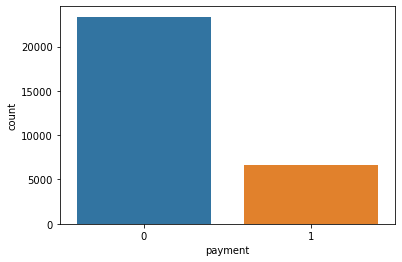

In [14]:
sns.countplot(x = 'payment', data = df);

### Handling Imbalanced Data

In [15]:
from imblearn.combine import SMOTETomek
sm = SMOTETomek(random_state=42)

In [16]:
x_new, y_new = sm.fit_resample(x, y)

In [17]:
x_new.shape

(45482, 23)

In [18]:
y_new.shape

(45482, 1)

In [19]:
y_new.value_counts()

payment
0          22741
1          22741
dtype: int64

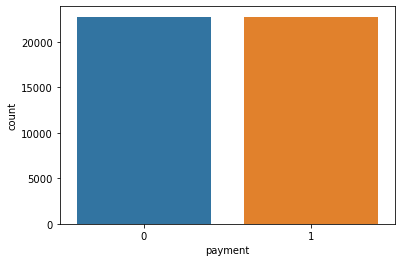

In [20]:
sns.countplot(x = 'payment', data = y_new);

# Feature Engineering

### Extra Tree Classifier

In [21]:
from sklearn.ensemble import ExtraTreesClassifier
extra_clf = ExtraTreesClassifier()

In [22]:
extra_clf.fit(x, y)

ExtraTreesClassifier()

In [23]:
feature_importance = extra_clf.feature_importances_

In [24]:
feature_importance

array([0.06577438, 0.01271973, 0.03280767, 0.02152377, 0.06638199,
       0.10168135, 0.04609656, 0.03231528, 0.03041606, 0.03028267,
       0.0281253 , 0.05067882, 0.04658248, 0.04490866, 0.0447565 ,
       0.04281971, 0.04416643, 0.04376953, 0.04223303, 0.04205439,
       0.04090607, 0.04263937, 0.04636023])

In [25]:
imp = pd.DataFrame(feature_importance, columns = ['gain_score'])

In [26]:
imp 

,gain_score
0,0.065774
1,0.012720
2,0.032808
3,0.021524
4,0.066382
5,0.101681
6,0.046097
7,0.032315
8,0.030416
9,0.030283


In [27]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [28]:
cols = pd.DataFrame(x.columns, columns = ['feature_names'])

In [29]:
gains = pd.concat([cols, imp], axis=1)

In [30]:
gains

,feature_names,gain_score
0,LIMIT_BAL,0.065774
1,SEX,0.012720
2,EDUCATION,0.032808
3,MARRIAGE,0.021524
4,AGE,0.066382
5,PAY_0,0.101681
6,PAY_2,0.046097
7,PAY_3,0.032315
8,PAY_4,0.030416
9,PAY_5,0.030283


In [31]:
gains.nlargest(15, 'gain_score')

,feature_names,gain_score
5,PAY_0,0.101681
4,AGE,0.066382
0,LIMIT_BAL,0.065774
11,BILL_AMT1,0.050679
12,BILL_AMT2,0.046582
22,PAY_AMT6,0.046360
6,PAY_2,0.046097
13,BILL_AMT3,0.044909
14,BILL_AMT4,0.044757
16,BILL_AMT6,0.044166


In [32]:
# Sort all with respect to gain_score
gains.nlargest(gains.shape[0], 'gain_score')

,feature_names,gain_score
5,PAY_0,0.101681
4,AGE,0.066382
0,LIMIT_BAL,0.065774
11,BILL_AMT1,0.050679
12,BILL_AMT2,0.046582
22,PAY_AMT6,0.046360
6,PAY_2,0.046097
13,BILL_AMT3,0.044909
14,BILL_AMT4,0.044757
16,BILL_AMT6,0.044166


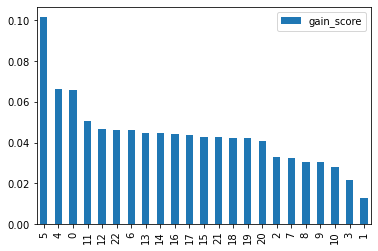

In [33]:
gains_all = gains.nlargest(gains.shape[0], 'gain_score')

# plotting
gains_all.plot(kind='bar');

<AxesSubplot:>

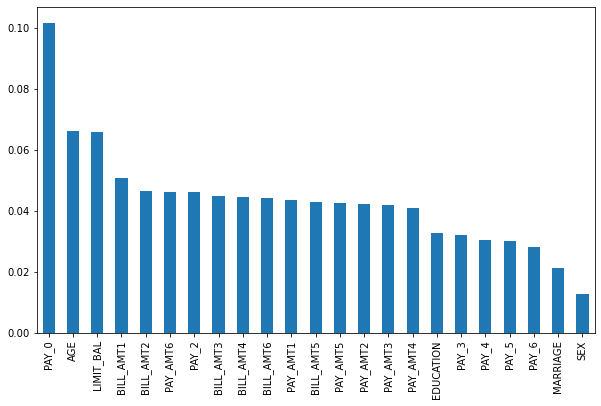

In [34]:
features = pd.Series(feature_importance, index = x.columns)
plt.figure(figsize= (10,6));
features.nlargest(features.shape[0]).plot(kind = 'bar')

In [35]:
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


<AxesSubplot:>

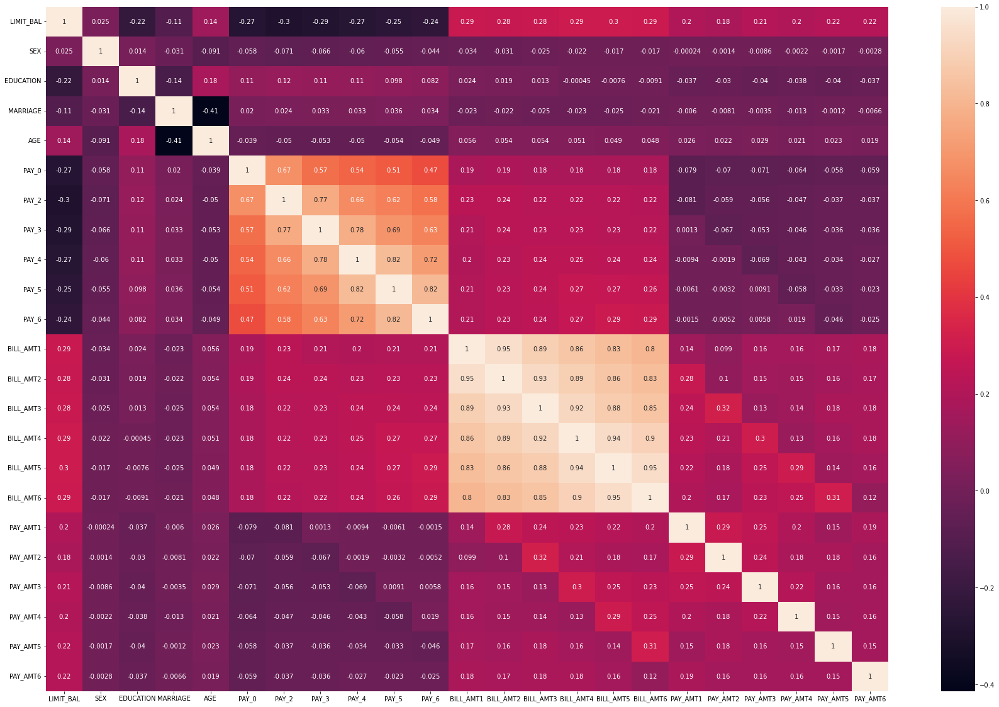

In [36]:
plt.figure(figsize = (30,20))
sns.heatmap(x.corr(), annot=True)

# Select K Best

In [37]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [38]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [39]:
y.head()

,payment
0,1
1,1
2,0
3,0
4,0


In [40]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression

In [41]:
model = SelectKBest(score_func= f_classif)

In [42]:
feature_score = model.fit(x, y)

In [43]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [44]:
feature_scores = pd.DataFrame(feature_score.scores_, columns=['feature_score'])
feature_scores

,feature_score
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [45]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [46]:
features = pd.DataFrame(x.columns, columns = ['feature_names'])

In [47]:
features

,feature_names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [48]:
scores = pd.concat([features, feature_scores], axis = 1)
scores

,feature_names,feature_score
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


# PCA - Principal Component Analysis

In [49]:
# first of all, we need scalling our data
from sklearn.preprocessing import MinMaxScaler
min_max = MinMaxScaler()
scaled_x = min_max.fit_transform(x)

In [50]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [51]:
scaled_x.shape

(30000, 23)

In [52]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components= 3)
x_pca = pca.fit_transform(scaled_x)

In [53]:
x_pca

array([[-0.40423245, -0.00800475, -0.00259663],
       [-0.39188881,  0.20922402, -0.19698746],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728835, -0.08489192],
       [ 0.60374479, -0.01953159,  0.21421066],
       [ 0.60917214,  0.0099741 ,  0.23321987]])

In [54]:
features = pd.DataFrame(x_pca, columns = ['pca1', 'pca2', 'pca3'])

In [55]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196987
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [56]:
import plotly.express as pl
pl.scatter_3d(features, x = 'pca1', y = 'pca2', z = 'pca3', color = 'pca1')

In [57]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(features, y, test_size= 0.3, random_state=42)

In [58]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()

In [59]:
clf.fit(xtrain, ytrain)

DecisionTreeClassifier()

In [60]:
clf.score(xtest, ytest)

0.7128888888888889

In [61]:
clf.score(xtrain, ytrain)

0.9995238095238095

##### with sampling data

In [62]:
scaled_x = min_max.fit_transform(x_new)

In [63]:
scaled_x.shape

(45482, 23)

In [64]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.25482533, 0.        , 0.16666667, ..., 0.00987507, 0.01454061,
        0.01143486],
       [0.27158665, 0.        , 0.33333333, ..., 0.00662463, 0.00820069,
        0.00590472],
       [0.05050505, 1.        , 0.16666667, ..., 0.00302412, 0.00765857,
        0.00169625]])

In [65]:
#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [66]:
x_pca

array([[-0.49718242, -0.02737989, -0.00653843],
       [-0.4892462 ,  0.17671335, -0.22821041],
       [-0.49403559,  0.05038231, -0.15265146],
       ...,
       [ 0.52652494,  0.21026026,  0.11711033],
       [ 0.48674535, -0.30548971,  0.13291441],
       [-0.46360938,  0.33558979,  0.09148678]])

In [67]:
features = pd.DataFrame(x_pca, columns= ['pca1', 'pca2', 'pca3'])
features

,pca1,pca2,pca3
0,-0.497182,-0.027380,-0.006538
1,-0.489246,0.176713,-0.228210
2,-0.494036,0.050382,-0.152651
3,-0.486347,0.062126,0.137459
4,0.512391,-0.115982,0.302559
...,...,...,...
45477,0.547494,0.438221,0.197266
45478,0.500177,-0.012455,-0.319511
45479,0.526525,0.210260,0.117110
45480,0.486745,-0.305490,0.132914


In [68]:
import plotly.express as pl
pl.scatter_3d(features, x = 'pca1', y = 'pca2', z = 'pca3', color = 'pca1')

In [69]:
xtrain, xtest, ytrain, ytest = train_test_split(features, y_new, test_size=0.3, random_state = 42)

In [70]:
clf.fit(xtrain, ytrain)

DecisionTreeClassifier()

In [71]:
clf.score(xtrain, ytrain)

0.9994032101014543

In [72]:
clf.score(xtest, ytest)

0.6627336020520337

# Before PCA

In [73]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state = 42)

In [74]:
clf.fit(xtrain, ytrain)

DecisionTreeClassifier()

In [75]:
clf.score(xtrain, ytrain)

0.9995238095238095

In [76]:
clf.score(xtest, ytest)

0.7288888888888889